In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

## Setup

In [5]:
#! ln -s /home/ubuntu/data/ data

In [3]:
PATH = Path('data/pascal')
trn_j = json.load((PATH / 'pascal_train2007.json').open())
IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','id','image_id','category_id','bbox'

cats = dict((o[ID], o['name']) for o in trn_j[CATEGORIES])
trn_fns = dict((o[ID], o[FILE_NAME]) for o in trn_j[IMAGES])
trn_ids = [o[ID] for o in trn_j[IMAGES]]

JPEGS = 'VOC2007/VOCdevkit/VOC2007/JPEGImages'
IMG_PATH = PATH/JPEGS

In [4]:
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for o in trn_j[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])
            trn_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trn_anno

trn_anno = get_trn_anno()

In [5]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [6]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

## Multi class

In [7]:
MC_CSV = PATH/'tmp/mc.csv'

In [8]:
trn_anno[12]

[(array([ 96, 155, 269, 350]), 7)]

In [9]:
mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]
mcs = [' '.join(str(p) for p in o) for o in mc]

In [10]:
df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'clas': mcs}, columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)

In [11]:
f_model=resnet34
sz=224
bs=64

In [14]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(PATH, JPEGS, MC_CSV, tfms=tfms)

In [15]:
x,y=next(iter(md.val_dl))

In [16]:
learn = ConvLearner.pretrained(f_model, md)
learn.opt_fn = optim.Adam

In [15]:
lrf=learn.lr_find(1e-5,100)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                  
    0      1.49196    7.363564   0.733413  



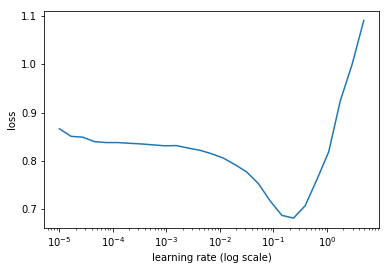

In [16]:
learn.sched.plot(0)

In [17]:
lr = 2e-2

In [18]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,5))

HBox(children=(IntProgress(value=0, description='Epoch', max=3), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                  
    0      0.323952   0.145743   0.953621  
    1      0.17257    0.078166   0.975308                  
    2      0.115699   0.075322   0.975654                  



[0.07532157, 0.9756535366177559]

In [19]:
lrs = np.array([lr/100, lr/10, lr])

In [20]:
learn.freeze_to(-2)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 81%|████████▏ | 26/32 [00:04<00:01,  5.49it/s, loss=0.337] 


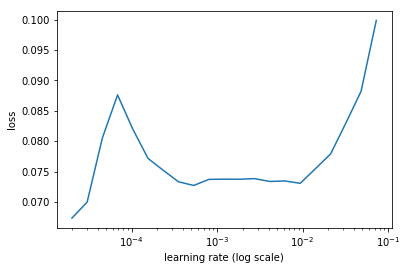

In [21]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [22]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(32,5))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                   
    0      0.072923   0.076181   0.973918  
    1      0.054426   0.081112   0.973069                   
    2      0.037561   0.07728    0.975068                   
    3      0.025875   0.076541   0.976067                   
    4      0.018567   0.077095   0.976014                   



[0.077095136, 0.9760141223669052]

In [23]:
learn.save('mclas')

In [17]:
learn.load('mclas')

In [18]:
y = learn.predict()
x,_ = next(iter(md.val_dl))
x = to_np(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


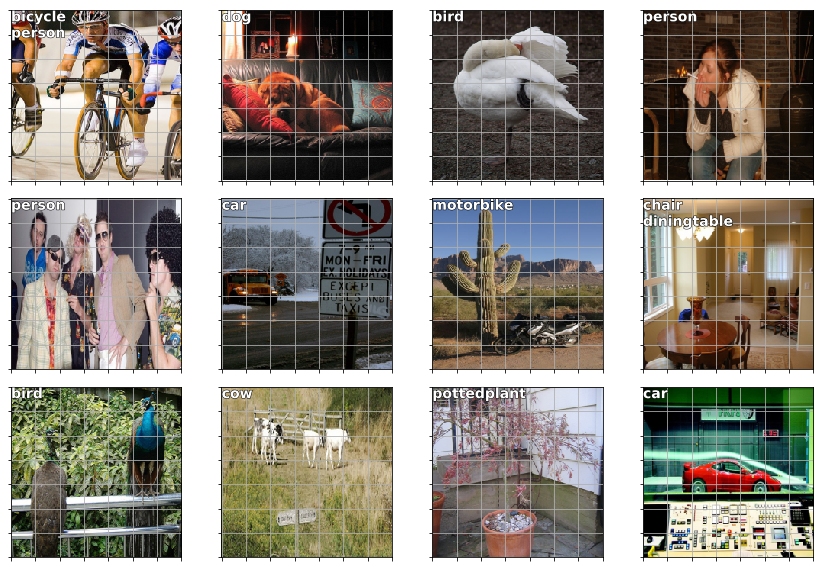

In [19]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.4)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima, ax=ax)
    draw_text(ax, (0,0), b)
plt.tight_layout()

## Bbox per cell

### Set up data

In [20]:
CLAS_CSV = PATH/'tmp/clas.csv'
MBB_CSV = PATH/'tmp/mbb.csv'

f_model=resnet34
sz=224
bs=64

In [21]:
# mc - list: all the categories (of objects) in each image
# id2cat - list: all the categories
# cat2id - dict: categories to index mapping
# mcs - list: all the category indices (of objects) in each image

In [22]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc]); mcs

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]),
       array([6]), array([11])], dtype=object)

In [32]:
# val_idxs - validation indices of each image
# val_mcs - list: all the category indices (of objects) in each image of validation set
# trn_mcs - list: all the category indices (of objects) in each image of train set

In [23]:
val_idxs = get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, mcs)

In [34]:
# mbb - list: list of the bbox vertices of all objects in each image
# mbbs - list: list of bbox vertices of all objects in string concatenated format in each image
# df - dataframe: mbbs in dataframe format

In [24]:
mbb = [np.concatenate([p[0] for p in trn_anno[o]]) for o in trn_ids]
mbbs = [' '.join(str(p) for p in o) for o in mbb]

df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'bbox': mbbs}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [36]:
# aug_tfms - list: list of transformations
# tfms - tuple: transformations tuple

In [25]:
aug_tfms = [RandomRotate(10, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, continuous=True, num_workers=4)

In [26]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [27]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [28]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [41]:
# trn_ds2 : dataset that contains image pixels, bbox coords and class values

In [29]:
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [45]:
# x - tensor: image pixels
# y[0] - list: list of bboxes coords of each object in images in validation set
# y[1] - list: list of class labes of each object in images in validation set

In [30]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


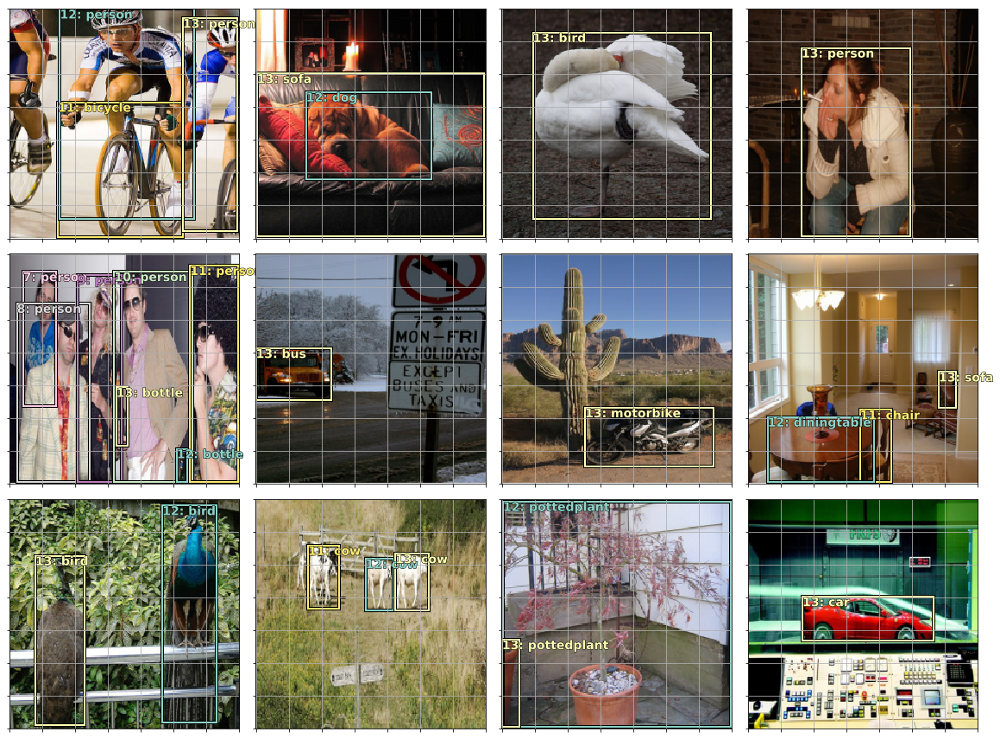

In [31]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i])
plt.tight_layout()

### Set up model

In [48]:
# k - ?
# ang_grid - int: grid size we are interested in
# anc_ctrs - array: anchor centres
# anc_sizes - array: anchor height and width
# anchors - array: anchor coords

In [32]:
anc_grid = 2
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

In [33]:
# grid_sizes - float: size of the each of the grid cell

In [34]:
V(np.array(1/anc_grid), requires_grad=False).unsqueeze(1)

Variable containing:
 0.5000
[torch.cuda.FloatTensor of size 1x1 (GPU 0)]

In [35]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

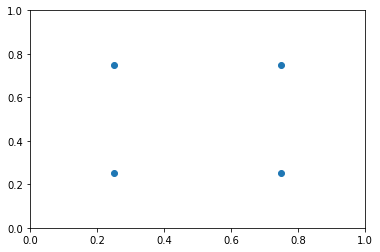

In [36]:
plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [37]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [38]:
# anchor_cnr - tensor: anchor corner coords - left bottom and right top

In [39]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [40]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [41]:
aaaa = iter(md.trn_dl)
for i in range(8):
    aa, ab = next(aaaa)
    print(ab[0].shape, ab[1].shape)

torch.Size([64, 52]) torch.Size([64, 13])
torch.Size([64, 40]) torch.Size([64, 10])
torch.Size([64, 52]) torch.Size([64, 13])
torch.Size([64, 36]) torch.Size([64, 9])
torch.Size([64, 52]) torch.Size([64, 13])
torch.Size([64, 48]) torch.Size([64, 12])
torch.Size([64, 60]) torch.Size([64, 15])
torch.Size([64, 40]) torch.Size([64, 10])


In [274]:
# n_clas - int: number of classes
# n_act - int: number of activations - classes + 4(for bboxes)

In [42]:
k

1

In [56]:
n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

In [67]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k): 
    #print(x.size(), k)
    return x.view(x.size(0),x.size(1)//k,-1).transpose(1,2)

In [68]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        #self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv1 = nn.Conv2d(nin, (len(id2cat))*k, 3, padding=1) # Changing the oconv1 and removing background.
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [69]:
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
        self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam
k

1

### Train

In [80]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1) ## -- Should this be just self.num_classes ?? I couldn't make this work.
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:] # I had to consider all the columns for the dimensions to match
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [81]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(lls,lcs)
    return lls+lcs

In [82]:
x,y = next(iter(md.val_dl))
# x,y = V(x).cpu(),V(y)
x,y = V(x),V(y)

In [83]:
# for i,o in enumerate(y): y[i] = o.cpu()
# learn.model.cpu()

In [84]:
batch = learn.model(x)

In [85]:
#anchors = anchors.cuda(); grid_sizes = grid_sizes.cuda(); anchor_cnr = anchor_cnr.cuda()

In [86]:
ssd_loss(batch, y, True)


 0.3366
 0.2396
 0.3091
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.1744
 0.3427
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2400
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2594
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2220
 0.4570
 0.2867
 0.3480
 0.2990
 0.0255
 0.0359
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.1583
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3744
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.1537
 0.4426
 0.0474
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.3093
 0.3393
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.1483
 0.0860
 0.1447
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.2483
 0.1152
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.1104
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.2625
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.2894
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2610
 0.2213
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3191
 0.0143
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 41.6830
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [78]:
%debug

> /home/ubuntu/src/anaconda3/envs/fastai/lib/python3.6/site-packages/torch/nn/functional.py(1227)binary_cross_entropy_with_logits()
   1225     """
   1226     if not (target.size() == input.size()):
-> 1227         raise ValueError("Target size ({}) must be the same as input size ({})".format(target.size(), input.size()))
   1228 
   1229     max_val = (-input).clamp(min=0)

ipdb> target.shape
torch.Size([4, 20])
ipdb> input.shape
torch.Size([4, 19])
ipdb> input
Variable containing:

Columns 0 to 9 
-3.0913 -3.1540 -3.0033 -3.1931 -3.1837 -2.9395 -3.3285 -2.6699 -3.0499 -2.9472
-2.8848 -2.7373 -2.9981 -2.8218 -2.9481 -2.9216 -3.0486 -2.5775 -2.9359 -3.1009
-2.4766 -3.0540 -2.9180 -2.9593 -3.1070 -3.0873 -3.3113 -3.2183 -3.0446 -2.7716
-2.9992 -3.0661 -3.2368 -2.8145 -3.1069 -2.9966 -3.1566 -3.2063 -2.8799 -2.9614

Columns 10 to 18 
-3.0553 -3.1202 -3.3741 -2.7214 -3.1639 -3.1415 -2.8856 -3.4812 -2.9337
-2.4988 -3.0031 -3.3113 -2.9715 -2.8943 -3.1074 -2.8916 -2.8139 -2.8655
-2.7045 -3.

In [87]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      48.718883  13983.173828



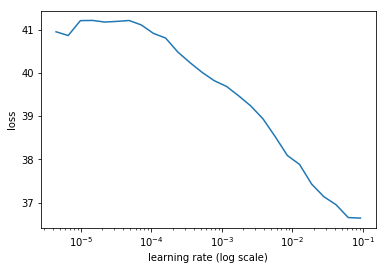

In [88]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [90]:
learn.fit(lr, 1, cycle_len=1, use_clr=(20,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      28.610696  24.751778 



[24.751778]

In [314]:
learn.fit(lr, 1, cycle_len=1, use_clr=(20,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      28.90921   24.224495 



[24.224495]

In [91]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      24.271438  27.02607  
    1      22.653442  21.637817                           
    2      21.021499  20.663399                           
    3      19.755574  20.015318                           
    4      18.628864  19.178988                           



[19.178988]

In [315]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      24.119961  25.758976 
    1      22.516896  21.88336                            
    2      21.115351  20.62833                            
    3      19.740426  19.493372                           
    4      18.526751  19.365887                           



[19.365887]

In [92]:
learn.save('0')

### Testing

In [93]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(V(x))
b_clas,b_bb = batch

In [94]:
b_clas.size(),b_bb.size()

(torch.Size([64, 4, 20]), torch.Size([64, 4, 4]))

In [95]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

(Variable containing:
  0.6786  0.4866  0.9911  0.6250
  0.7098  0.0848  0.9911  0.5491
  0.5134  0.8304  0.6696  0.9063
 [torch.cuda.FloatTensor of size 3x4 (GPU 0)], Variable containing:
   8
  10
  17
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [96]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

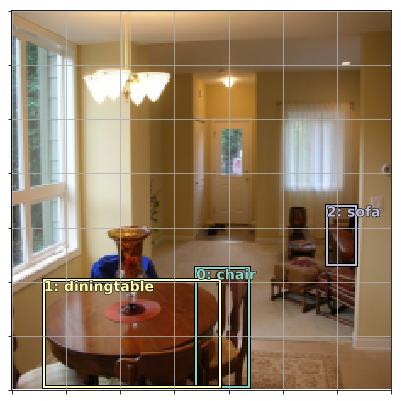

In [97]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

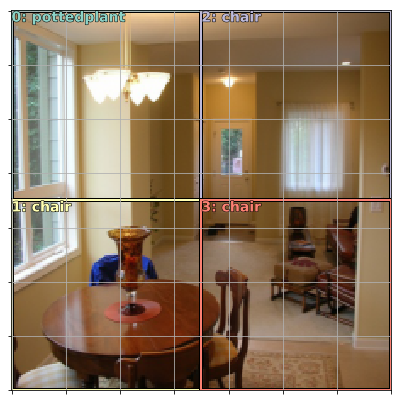

In [98]:
# After making the background related change
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

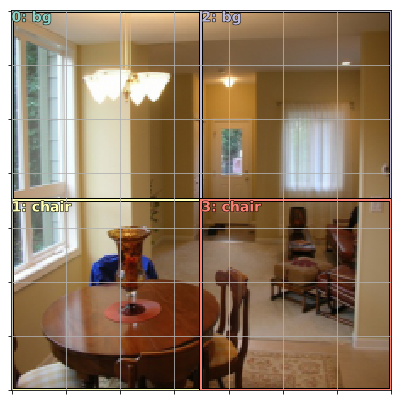

In [45]:
# Before making the background related change
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

In [99]:
a_ic = actn_to_bb(b_bboxi, anchors)

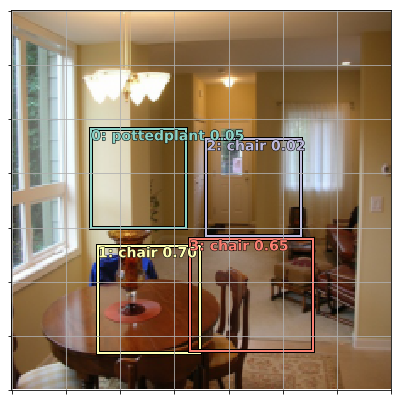

In [101]:
# After making the background related change
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

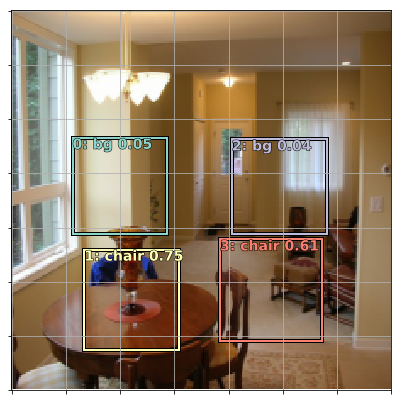

In [47]:
# Before making the background related change
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [133]:
bbox.data


 0.6786  0.4866  0.9911  0.6250
 0.7098  0.0848  0.9911  0.5491
 0.5134  0.8304  0.6696  0.9063
[torch.cuda.FloatTensor of size 3x4 (GPU 0)]

In [134]:
anchor_cnr.data


 0.0000  0.0000  0.5000  0.5000
 0.5000  0.0000  1.0000  0.5000
 0.0000  0.5000  0.5000  1.0000
 0.5000  0.5000  1.0000  1.0000
[torch.cuda.FloatTensor of size 4x4 (GPU 0)]

In [135]:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps


 0.0000  0.0145  0.0000  0.1537
 0.0000  0.4426  0.0000  0.0377
 0.0000  0.0000  0.0000  0.0474
[torch.cuda.FloatTensor of size 3x4 (GPU 0)]

In [136]:
overlaps.max(1)

(
  0.1537
  0.4426
  0.0474
 [torch.cuda.FloatTensor of size 3 (GPU 0)], 
  3
  1
  3
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [137]:
overlaps.max(0)

(
  0.0000
  0.4426
  0.0000
  0.1537
 [torch.cuda.FloatTensor of size 4 (GPU 0)], 
  0
  1
  0
  0
 [torch.cuda.LongTensor of size 4 (GPU 0)])

In [138]:
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(
  0.0000
  1.9900
  0.0000
  1.9900
 [torch.cuda.FloatTensor of size 4 (GPU 0)], 
  0
  1
  0
  2
 [torch.cuda.LongTensor of size 4 (GPU 0)])

In [139]:
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
  8
 10
  8
 17
[torch.cuda.LongTensor of size 4 (GPU 0)]

In [141]:
thresh = 0.35
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


 1
 3
[torch.cuda.LongTensor of size 2 (GPU 0)]

In [142]:
gt_clas[neg_idx] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg', 'diningtable', 'bg', 'sofa']

In [143]:
gt_bbox = bbox[gt_idx]
loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

RuntimeError: cuda runtime error (59) : device-side assert triggered at /opt/conda/conda-bld/pytorch_1518244421288/work/torch/lib/THC/generic/THCTensorCopy.c:70

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


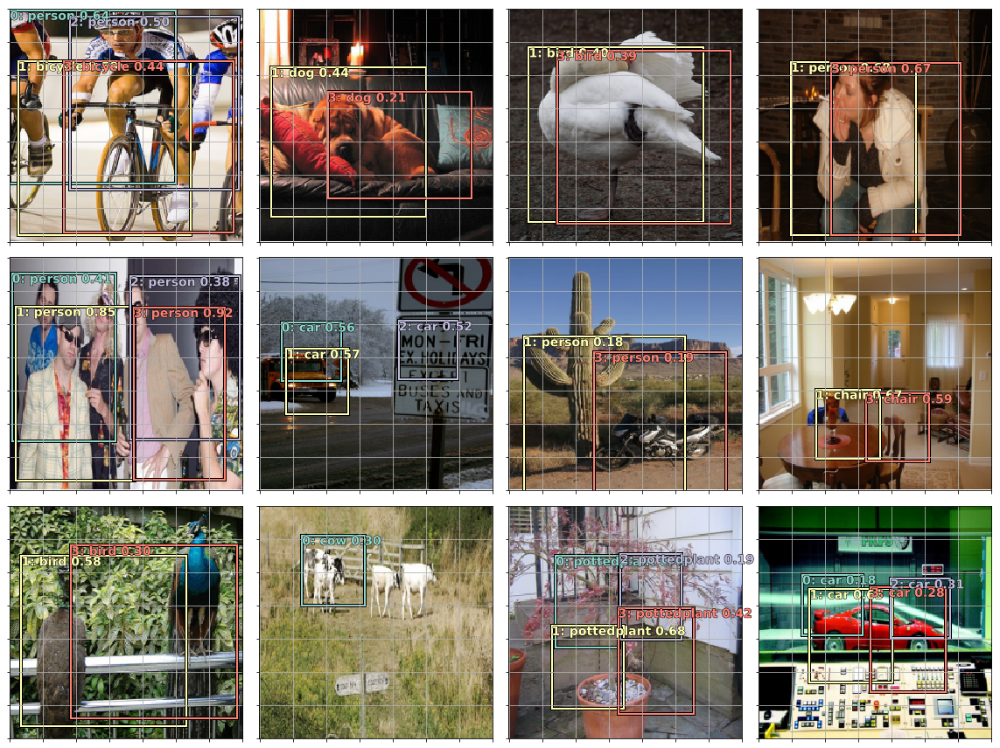

In [348]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.15)
plt.tight_layout()

## More anchors!

### Create anchors

In [428]:
anchor_scales
k

9

In [429]:
anc_grids, anc_offsets

([4, 2, 1], [0.125, 0.25, 0.5])

In [430]:
# anchor_scales - array: array of different sized boxes
# k - int: number of such anchor scales

In [431]:
anc_grids = [4,2,1]
# anc_grids = [1]
anc_zooms = [0.75, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)] # square, vertical rectange, horizontal rectangle
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]

In [432]:
anc_grids, anc_offsets

([4, 2, 1], [0.125, 0.25, 0.5])

In [433]:
anchor_scales

[(0.75, 0.75),
 (0.75, 0.375),
 (0.375, 0.75),
 (1.0, 1.0),
 (1.0, 0.5),
 (0.5, 1.0),
 (1.3, 1.3),
 (1.3, 0.65),
 (0.65, 1.3)]

In [434]:
len(anc_ctrs)

189

In [435]:
# anc_ctrs - array: anchor centres array
# 

In [436]:
anc_x = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [437]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [438]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [367]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


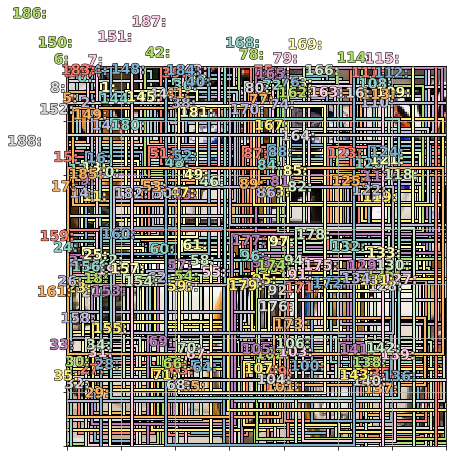

In [368]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

### Model

In [439]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv1 = StdConv(512,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

learn.crit = ssd_loss
lr = 2e-3
lrs = np.array([lr/100,lr/10,lr])

In [440]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

torch.Size([64, 189, 4, 4]) 9
torch.Size([64, 36, 4, 4]) 9
torch.Size([64, 189, 2, 2]) 9
torch.Size([64, 36, 2, 2]) 9
torch.Size([64, 189, 1, 1]) 9
torch.Size([64, 36, 1, 1]) 9


In [371]:
batch[0].size(),batch[1].size()

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [372]:
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5718
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8714
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5163
 0.4763
 0.4033
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3985
 0.6215
 0.5547
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3436
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3900
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.5395
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7618
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4679
 0.8070
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6597
 0.1274
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 334.3339
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [373]:
learn.lr_find(lrs/1000,1.)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      570.194828 581420.875



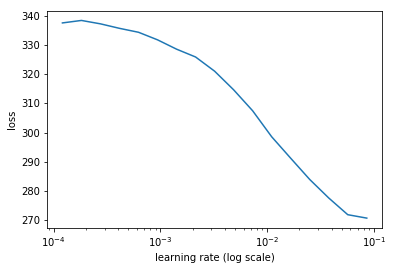

In [374]:
learn.sched.plot()

In [375]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(10,2))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      190.383471 145.967346



[145.96735]

In [376]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      136.686242 126.747833
    1      122.30711  109.106659                         
    2      111.93217  103.111732                         
    3      103.653175 96.691818                          
    4      95.959657  93.971207                           
    5      90.312372  90.880981                           
    6      85.980176  89.580856                           
    7      83.204017  88.944                              



[88.944]

In [377]:
learn.save('tmp')

In [373]:
learn.freeze_to(-2)
learn.fit(lr, 1, cycle_len=10, use_clr=(10,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      63.40004   110.712814
    1      65.978227  99.409355                                                                                        
    2      64.419958  69.094055                                                                                        
    3      61.511615  68.682999                                                                                        
    4      58.273493  66.503235                                                                                        
    5      55.195502  65.400146                                                                                        
    6      52.029294  63.787411                                                                                        
    7      48.869376  63.335697                                                                                        
    8  

[60.480648]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


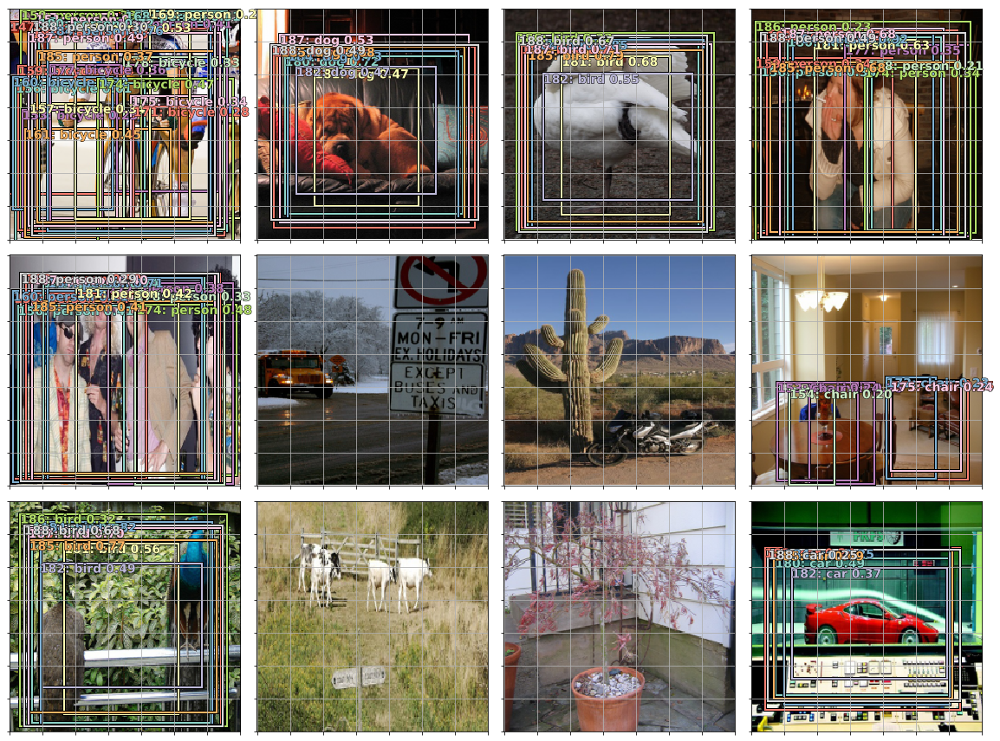

In [378]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.2)
plt.tight_layout()

### Focal loss

In [379]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

In [380]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [381]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5718
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8714
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5163
 0.4763
 0.4033
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3985
 0.6215
 0.5547
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3436
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3900
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.5395
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7618
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4679
 0.8070
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6597
 0.1274
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 21.7703
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [382]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(20,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      16.052264  16.447533 



[16.447533]

In [383]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      14.447937  16.240419 
    1      14.11687   15.022554                           
    2      13.530639  14.298905                           
    3      13.035885  13.864291                           
    4      12.479106  13.460115                           
    5      11.959562  13.344691                           
    6      11.559368  13.159472                           
    7      11.217058  13.04135                            



[13.04135]

In [70]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      20.838904  17.688156 
    1      17.655354  15.106363                                                                                        
    2      16.01816   14.220242                                                                                        
    3      14.727699  13.734037                                                                                        
    4      13.753461  13.286221                                                                                        
    5      13.05603   12.903882                                                                                        
    6      12.450726  12.80545                                                                                         
    7      11.965644  12.656506                                                                                        



[12.656506]

In [384]:
learn.save('fl0')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


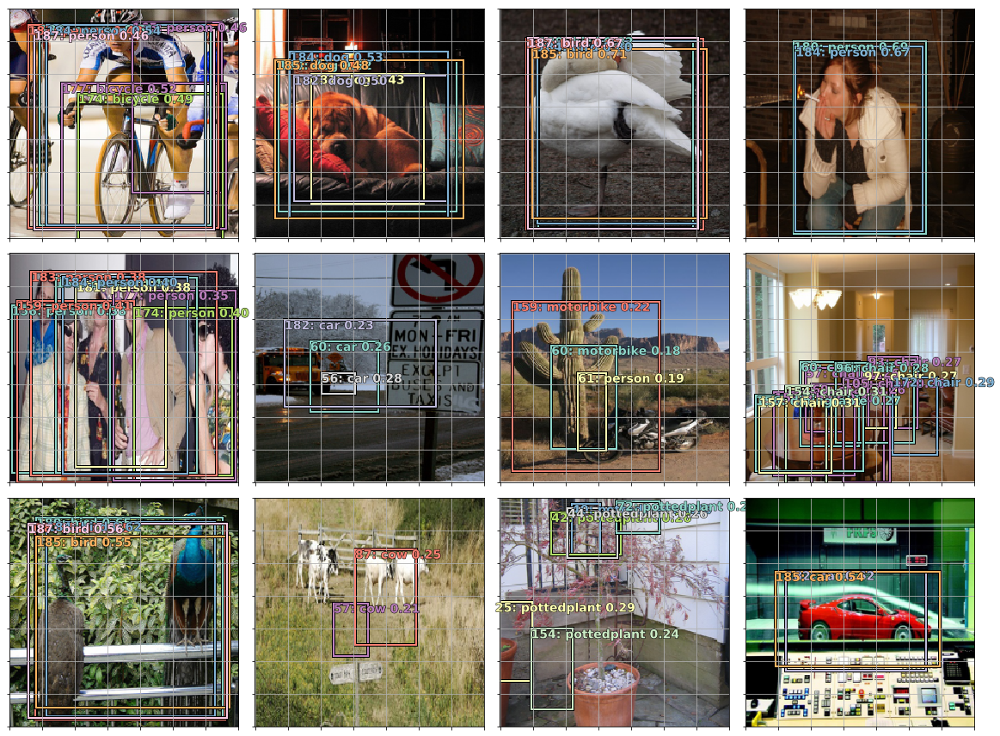

In [385]:
plot_results(0.8)

In [386]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      11.267873  13.293119 
    1      11.281314  12.843557                           
    2      10.977053  12.566297                           
    3      10.710324  12.663881                           
    4      10.411776  12.249556                           
    5      10.113352  12.217548                           
    6      9.824865   12.003937                           
    7      9.61608    11.961845                           
    8      9.354772   11.935905                           
    9      9.203405   11.946494                           



[11.946494]

In [112]:
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      9.034585   11.891396 
    1      9.087011   11.873768                                                                                        
    2      9.02608    11.87599                                                                                         
    3      8.93426    11.781538                                                                                        
    4      8.825759   11.746197                                                                                        
    5      8.716899   11.675211                                                                                        
    6      8.551062   11.591934                                                                                        
    7      8.44496    11.533642                                                                                        
    8  

[11.529757]

In [387]:
learn.save('drop4')

In [388]:
learn.load('drop4')

In [40]:
learn.unfreeze()
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      8.207191   11.783035 
    1      8.246271   11.854383                                                                                        
    2      8.270361   11.779552                                                                                        
    3      8.224936   11.75123                                                                                         
    4      8.202758   11.62597                                                                                         
    5      8.090048   11.58369                                                                                         
    6      8.026234   11.623518                                                                                        
    7      7.928645   11.568427                                                                                        
    8  

[11.570904]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


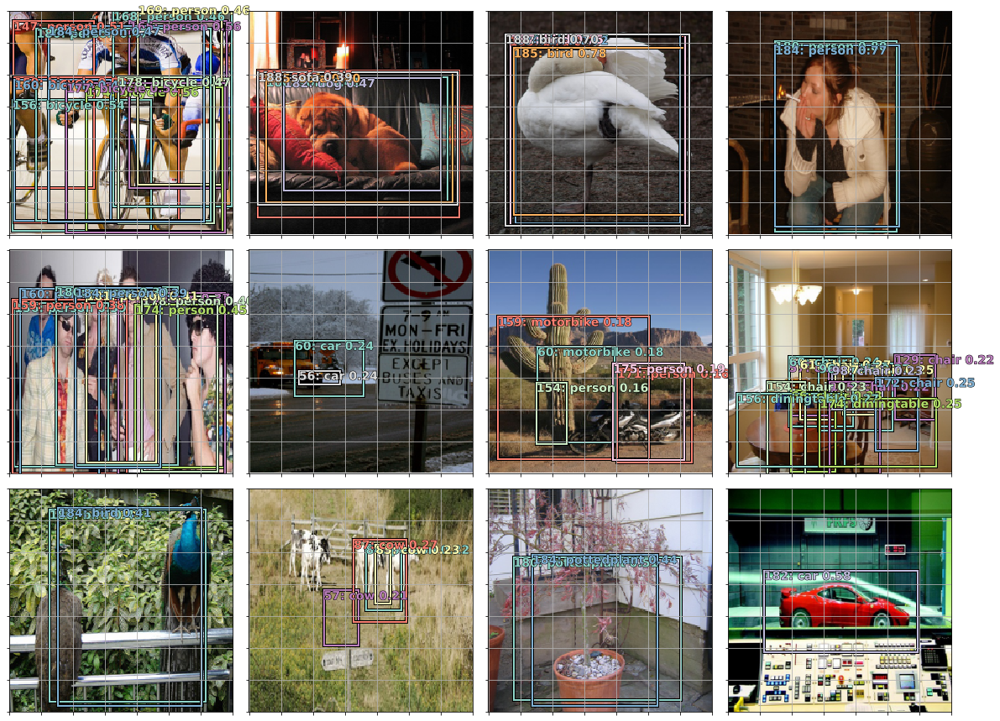

In [389]:
plot_results(0.8)

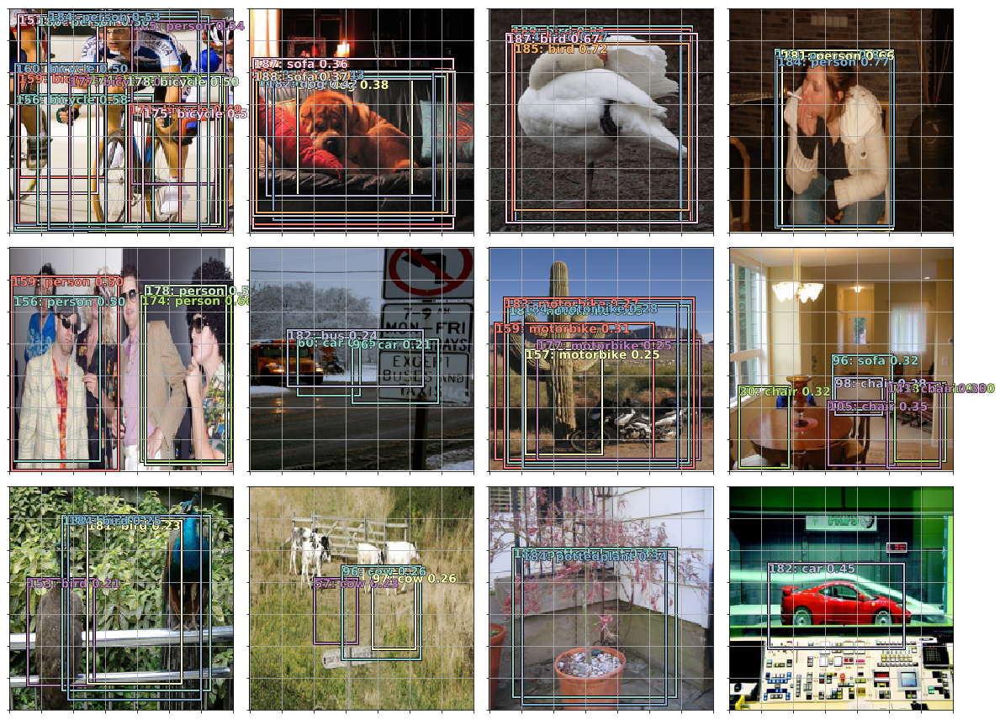

In [74]:
plot_results(0.8)

### NMS

In [390]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [391]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [392]:
idx=1
ima=md.val_ds.ds.denorm(x)[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
a_ic = actn_to_bb(b_bb[idx], anchors)
clas_pr, clas_ids = b_clas[idx].max(1)
clas_pr = clas_pr.sigmoid()

conf_scores = b_clas[idx].sigmoid().t().data

In [393]:
out1,out2,cc = [],[],[]
for cl in range(0, len(conf_scores)-1):
    c_mask = conf_scores[cl] > 0.25
    if c_mask.sum() == 0: continue
    scores = conf_scores[cl][c_mask]
    l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
    boxes = a_ic[l_mask].view(-1, 4)
    ids, count = nms(boxes.data, scores, 0.4, 50)
    ids = ids[:count]
    out1.append(scores[ids])
    out2.append(boxes.data[ids])
    cc.append([cl]*count)
cc = T(np.concatenate(cc))
out1 = torch.cat(out1)
out2 = torch.cat(out2)

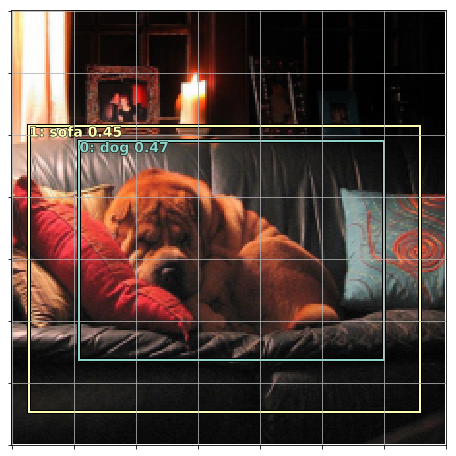

In [394]:
fig, ax = plt.subplots(figsize=(8,8))
torch_gt(ax, ima, out2, cc, out1, 0.1)

## End